In [1]:
import jax

jax.config.update("jax_platform_name", "cpu")
import numpyro

numpyro.set_host_device_count(4)

import sys

sys.path.append("..")
from pymc_experimental.statespace import structural as st
import matplotlib.pyplot as plt
import pymc as pm
import arviz as az
import pytensor.tensor as pt
import numpy as np
import pandas as pd

plt.rcParams.update(
    {
        "figure.figsize": (14, 4),
        "figure.dpi": 144,
        "figure.constrained_layout.use": True,
        "axes.grid": True,
        "grid.linewidth": 0.5,
        "grid.linestyle": "--",
        "axes.spines.top": False,
        "axes.spines.bottom": False,
        "axes.spines.left": False,
        "axes.spines.right": False,
    }
)

In [2]:
def simulate_from_numpy_model(mod, rng, steps=100):
    """
    Helper function to visualize the components outside of a PyMC model context
    """
    x0, P0, c, d, T, Z, R, H, Q = mod.x0, mod.P0, mod.c, mod.d, mod.T, mod.Z, mod.R, mod.H, mod.Q
    k_states = mod.k_states
    k_posdef = mod.k_posdef

    x = np.zeros((steps, k_states))
    y = np.zeros(steps)

    x[0] = x0
    y[0] = Z @ x0

    if not np.allclose(H, 0):
        y[0] += rng.multivariate_normal(mean=np.zeros(1), cov=H)

    for t in range(1, steps):
        if k_posdef > 0:
            shock = rng.multivariate_normal(mean=np.zeros(k_posdef), cov=Q)
            innov = R @ shock
        else:
            innov = 0

        if not np.allclose(H, 0):
            error = rng.multivariate_normal(mean=np.zeros(1), cov=H)
        else:
            error = 0

        x[t] = c + T @ x[t - 1] + innov
        y[t] = d + Z @ x[t] + error

    return x, y


def simulate_many_trajectories(mod, rng, n_simulations, steps=100):
    k_states = mod.k_states
    k_posdef = mod.k_posdef

    xs = np.zeros((n_simulations, steps, k_states))
    ys = np.zeros((n_simulations, steps))

    for i in range(n_simulations):
        x, y = simulate_from_numpy_model(mod, rng, steps)
        xs[i] = x
        ys[i] = y
    return xs, ys

In [3]:
seed = sum(map(ord, "Structural Timeseries"))

rng = np.random.default_rng(seed)

# Introduction

This notebook is an introduction to the structural timeseries modeling framework introduced in `pymc_experimental.statespace`. 

The structural timeseries framework, described by Durbin and Koopsman (2010) in Chapter 3.6, is a way to decompose a univariate timeseries into component parts:

$$y_t = \mu_t + \gamma_t + c_t + \varepsilon_t$$

Where $\mu_t$ is a trend component, $\gamma_t$ is a seasonal component, $c_t$ is a cycle component, and $\varepsilon_t$ is a measurement error. Each of the components can themselves be constant or have stochastic innovations, rendering them time-varying.

The API for this class of model is modular, and allows you to mix-and-match components to make the time series of your dreams.

# Level and Trend Component

The most basic componet is the `LevelTrendComponent`, represented by $\mu_t$. This component allows for a time trend wit as many time derivatives as you like. To illustrate, we begin with a constant mean model.

`LevelTrendComponent` has two argumnets: `order` and `innovations_order`. `order` controls the number of non-zero time derivatives to include in the trend, while `innovations_order` is the number of components to have a stochastic innovation. To make a constant level, we include 1 derivative, and no innovations

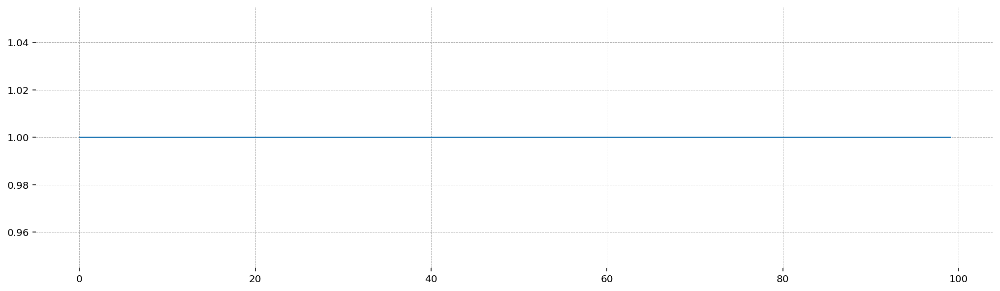

In [4]:
ll = st.LevelTrendComponent(order=1, innovations_order=0)
ll.x0[0] = 1
plt.plot(simulate_from_numpy_model(ll, rng)[0][:, 0])

If we have 2 derivatives with no innovations, we get a deterministic trend model

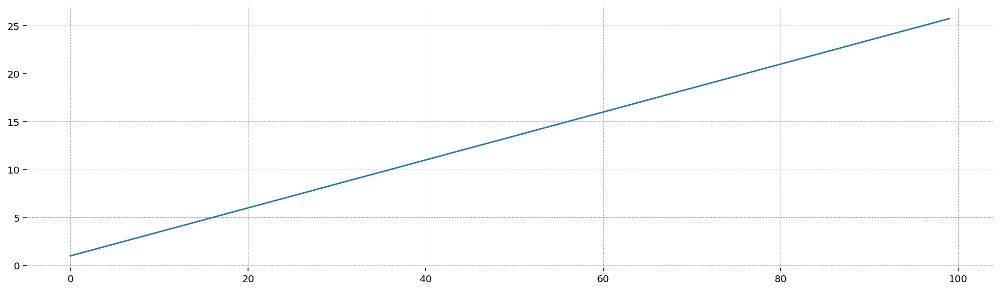

In [5]:
ll = st.LevelTrendComponent(order=2, innovations_order=0)
ll.x0[:] = [1, 0.25]
plt.plot(simulate_from_numpy_model(ll, rng)[0][:, 0])

With 3 we can have a quadratic trend, and so on

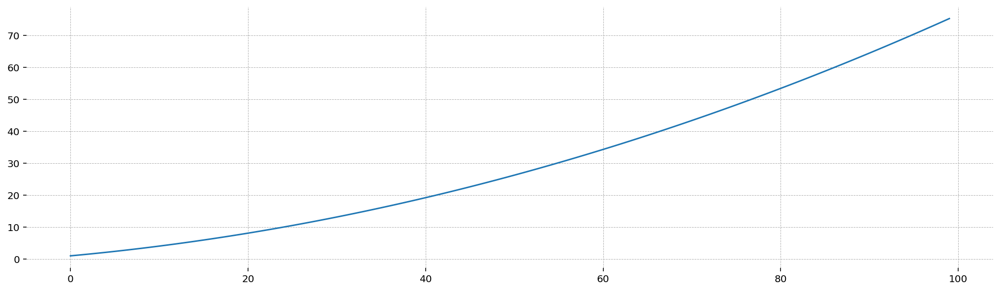

In [6]:
ll = st.LevelTrendComponent(order=3, innovations_order=0)
ll.x0[:] = [1, 0.25, 0.01]
plt.plot(simulate_from_numpy_model(ll, rng)[0][:, 0])

To introduce time-varying elements into the model, we set the innovations order. 

* By default, the innovations order is equal to the order (all components of the trend are time-varying)
* If you pass an integer, all components beyond that integer will be static
* You can also pass a list of `1` for "include innovations at this order" and `0` for "exclude at this order"

A Gaussian Random Walk can be implemented using `order=1, innovations_order=1`

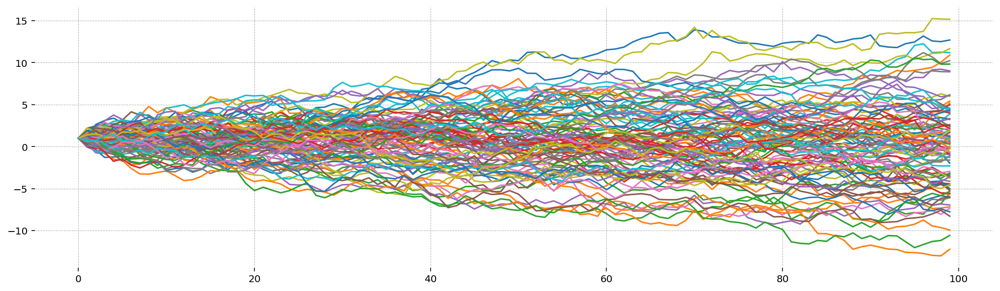

In [7]:
grw = st.LevelTrendComponent(order=1, innovations_order=1)
grw.x0[0] = 1
grw.Q[0] = 0.25
plt.plot(simulate_many_trajectories(grw, rng, 100)[1].T);

A random walk with drift would have `order=2` but `innovations_order = 1`

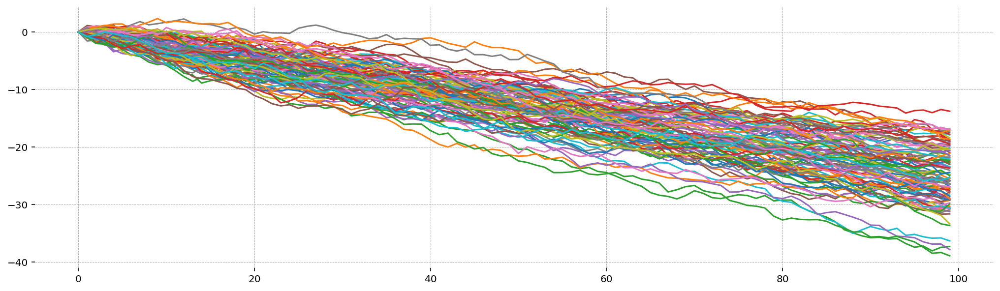

In [8]:
rwd = st.LevelTrendComponent(order=2, innovations_order=1)
rwd.x0[:] = [0, -0.25]
rwd.Q[0] = 0.25
plt.plot(simulate_many_trajectories(rwd, rng, 100)[1].T);

The local level model has `order=2` and `innovations_order = 2`. It corresponds to a Random walk with drift, where the drift also follows a random walk.

This is the first model where it's interesting to look at both hidden states and see their contributions to the final model. As promised, the trend component follows a random walk, while the level is a random walk with drift, with the drift at time $t$ equal to the trend at time $t-1$.

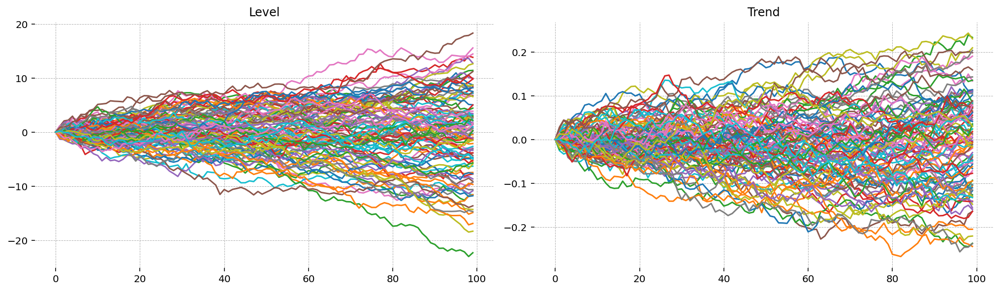

In [9]:
ll = st.LevelTrendComponent(order=2)
ll.x0[:] = [0, -0]
ll.Q = np.diag([0.25, 1e-4])

fig, ax = plt.subplots(1, 2)
xs, ys = simulate_many_trajectories(ll, rng, 100)
titles = ["Level", "Trend"]
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)
    axis.set_title(titles[i])
plt.show()

Durbin and Koopsman mention that many analysts find the level components produced by the local level model change too rapidly. In this case, they suggest to disable the innovations on the level, and have them only on the trend:

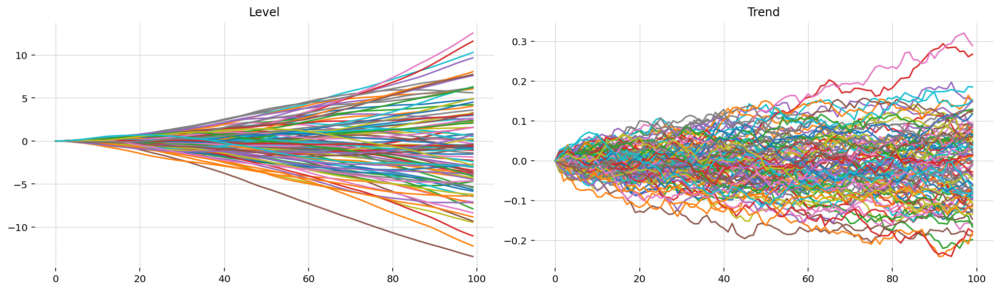

In [10]:
smooth_level = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
smooth_level.Q[0, 0] = 1e-4

fig, ax = plt.subplots(1, 2)
xs, ys = simulate_many_trajectories(smooth_level, rng, 100)
titles = ["Level", "Trend"]
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)
    axis.set_title(titles[i])
plt.show()

# Seasonal Components

Durbin and Koopsman present argue for two "cannonical" seasonal components: on in the time domain, and one in the frequency domain. Both are available in `statespace.structural`, as `TimeSeasonality` and `FreqSeasonal`, respectively.

## Time Domain Seasonality

Time domain seasonality is autoregressive. Seasonal effects are a repeating pattern over `season_length`, with the net effect summing to 0.

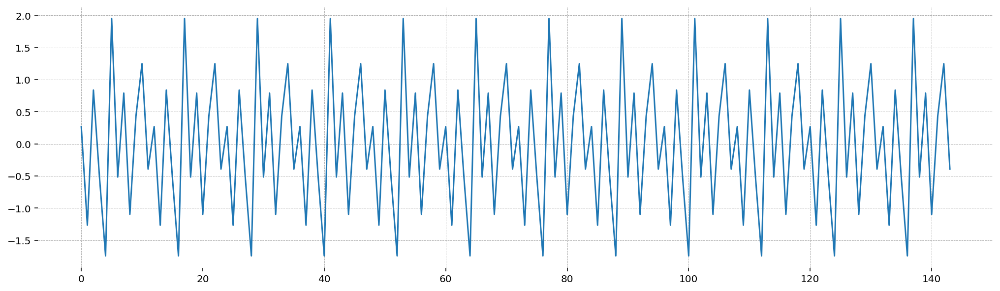

In [11]:
monthly_season = st.TimeSeasonality(season_length=12, innovations=False)

# Since there's no innovations, x0 (the initial state) gives the strength of each period in the season
monthly_season.x0[:] = rng.normal(size=11)
x, y = simulate_from_numpy_model(monthly_season, rng, steps=12 * 12)
plt.plot(y)

As promised, they sum to zero

In [12]:
np.allclose(y.reshape(-1, 12).sum(axis=1), 0)

True

When `innovations = True`, the seasonal components are time varying.

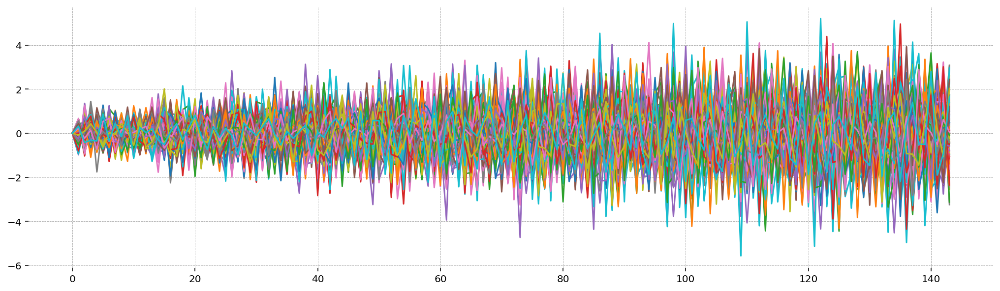

In [13]:
monthly_season = st.TimeSeasonality(season_length=12, innovations=True)
monthly_season.Q[:] = 0.1
xs, ys = simulate_many_trajectories(monthly_season, rng, n_simulations=100, steps=12 * 12)
plt.plot(ys.T);

## Frequency Domain Seasonality

An alternative to using lagged terms is to use Fourier terms. In this case, the user can specify both the `seasonal_length` and the number of fourier terms to include. At `seasonal_length // 2` the representation is "saturated", so that's the highest you'll ever need to go (and that's what you get by default).

Here are the six different frequencies we get for a monthly model. Since there are no innnovations, the strength of each frequency is entirely determined by the initial state.

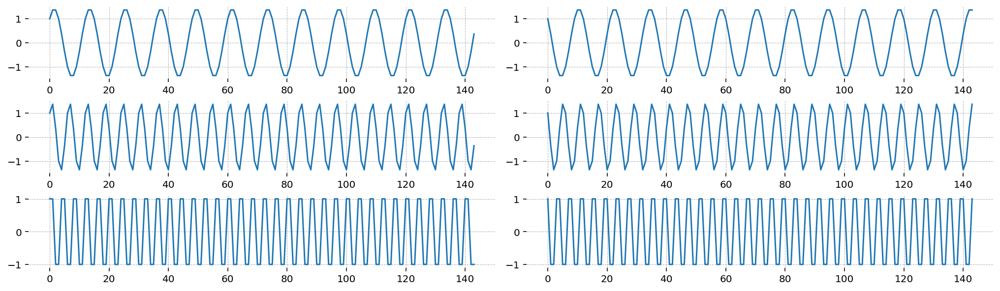

In [14]:
monthly_season = st.FrequencySeasonality(season_length=12, n=6)
monthly_season.x0 = np.ones((12,))
x, y = simulate_from_numpy_model(monthly_season, rng, steps=12 * 12)
fig, ax = plt.subplots(3, 2)
for i, axis in enumerate(fig.axes):
    axis.plot(x[:, i])

The observed state is the sum of the frequencies

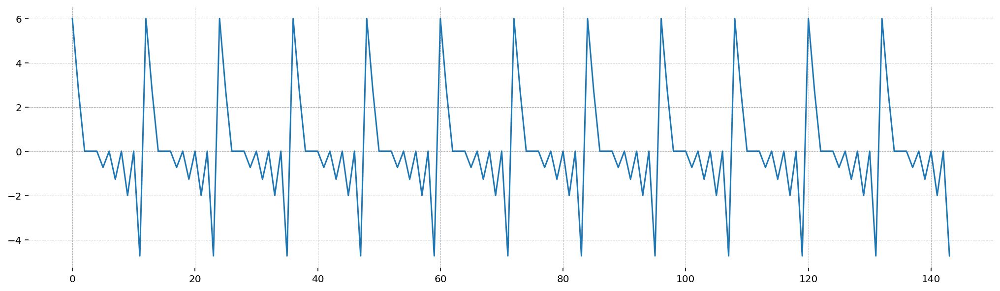

In [15]:
fig, ax = plt.subplots()
ax.plot(y);

When `innovations=True`, the states are time-varying

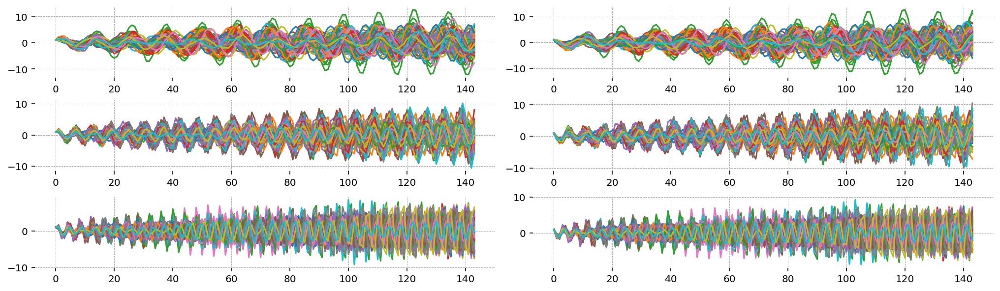

In [16]:
monthly_season = st.FrequencySeasonality(season_length=12, n=6, innovations=True)
monthly_season.x0 = np.ones((12,))
monthly_season.Q[:, :] = np.eye(12) * 0.069
xs, ys = simulate_many_trajectories(monthly_season, rng, steps=12 * 12, n_simulations=100)

fig, ax = plt.subplots(3, 2)
for i, axis in enumerate(fig.axes):
    axis.plot(xs[:, :, i].T)

## Autoregressive Component

The autoregressive component can be thought of as a way to introduce serially correlated errors into the model, rather than just white noise. The `order` argument governs how many lags to introduce. Like the `innovations_order` argumnet of the `LevelTrendComponent`, the `AutoregressiveComponent` can also take a list of 1's and 0's to specify which AR orders you would like included.

With no innovations, the AR component will look like an impulse response function

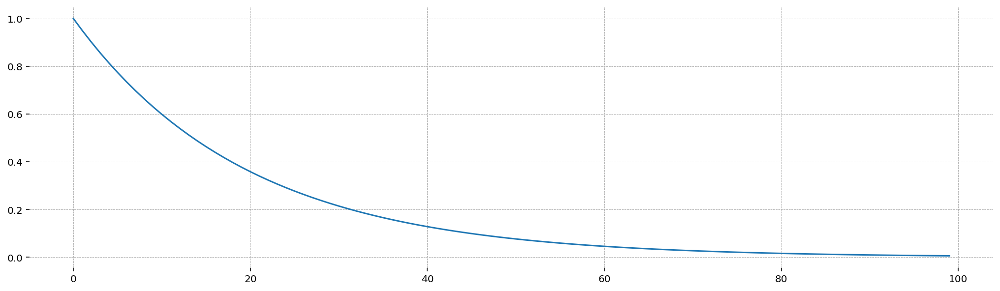

In [17]:
ar = st.AutoregressiveComponent(order=1)
ar.x0[:] = 1
ar.T[0, 0] = 0.95
x, y = simulate_from_numpy_model(ar, rng)
plt.plot(y)

One has to take care with the AR parameters, however. If they aren't stationary, the model won't be etiher. Ideally, non-stationary behavior should come from the level components, not the AR components. Actually, an AR(1) with `rho = 1` is just a Gaussian random walk!

If the parameter is bigger than one in absolutely value, you will get exponential blowup

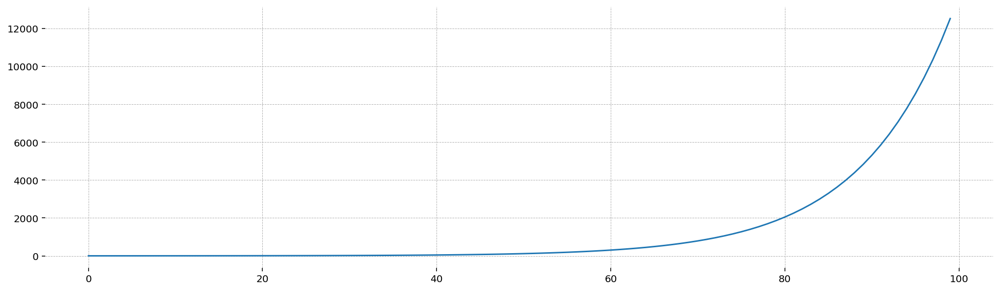

In [18]:
ar = st.AutoregressiveComponent(order=1)
ar.x0[:] = 1
ar.T[0, 0] = 1.1
x, y = simulate_from_numpy_model(ar, rng)
plt.plot(y)

Higher order AR processes are more difficult to keep stationary. Nevertheless, here's draws form an AR(3) with innovations

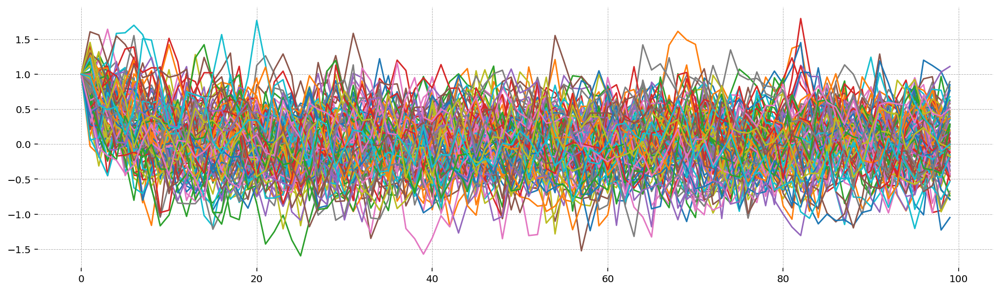

In [19]:
ar3 = st.AutoregressiveComponent(order=3)
ar3.x0[:] = 1
ar3.T[0, :] = [0.7, -0.25, 0.3]
ar3.Q[0, 0] = 0.1
xs, ys = simulate_many_trajectories(ar3, rng, 100)
plt.plot(ys.T);

# Combining components

More interesting models can be created by combining components. Components are combined by simple addition.

There is one special component, `MeasurementError`, that cannot be used on its own. It adds measurement error to the model.

Here is a local-linear trend model with monthly seasonality and measurement error:

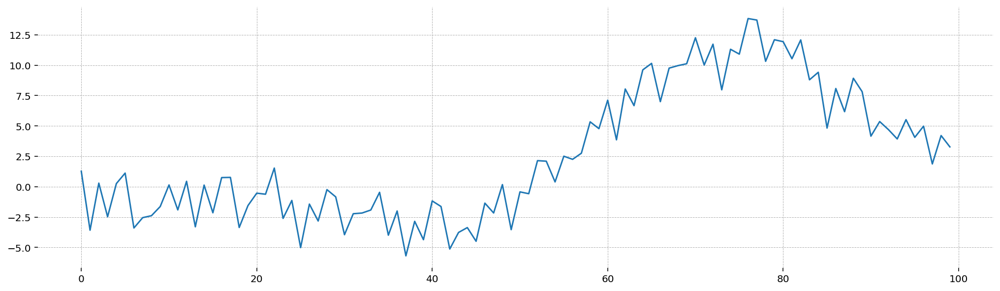

In [20]:
ll = st.LevelTrendComponent(order=2)
ll.Q[:, :] = np.diag([0.25, 0.01])
monthly_season = st.TimeSeasonality(season_length=12, innovations=False)
monthly_season.x0[:] = rng.normal(size=11)
measurement_error = st.MeasurementError()
measurement_error.H[0, 0] = 0.1

mod = ll + monthly_season + measurement_error

x, y = simulate_from_numpy_model(mod, rng)
plt.plot(y)

Nothing stops you from having many of the same component. This is especially relevant for seasonal components. Here is a model with both annual and monthly seasonality, in addition to the smooth trend

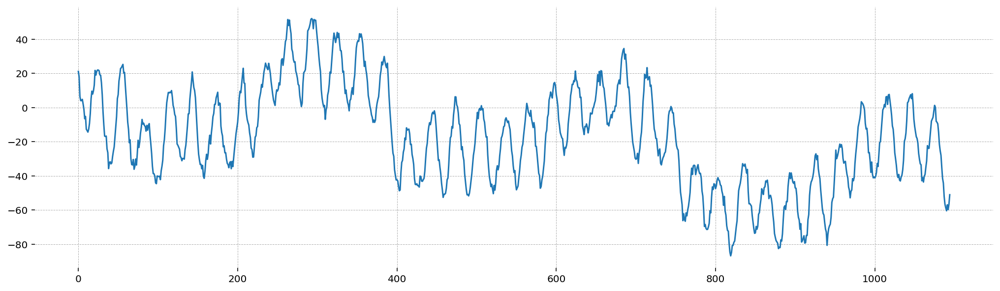

In [21]:
n_month = 1
n_year = 1

smooth_trend = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
smooth_trend.Q[:, :] = 1e-5

ar = st.AutoregressiveComponent(order=1)
ar.T[0, 0] = 0.95
ar.Q[0, 0] = 10

monthly_season = st.FrequencySeasonality(season_length=30, n=n_month)
monthly_season.x0[:] = rng.normal(scale=20, size=n_month * 2)

annual_season = st.FrequencySeasonality(season_length=365, n=n_year)
annual_season.x0[:] = rng.normal(scale=20, size=n_year * 2)

mod = smooth_trend + ar + monthly_season + annual_season
x, y = simulate_from_numpy_model(mod, rng, steps=365 * 3)
plt.plot(y)

We can see the different components by looking at the model's hidden states

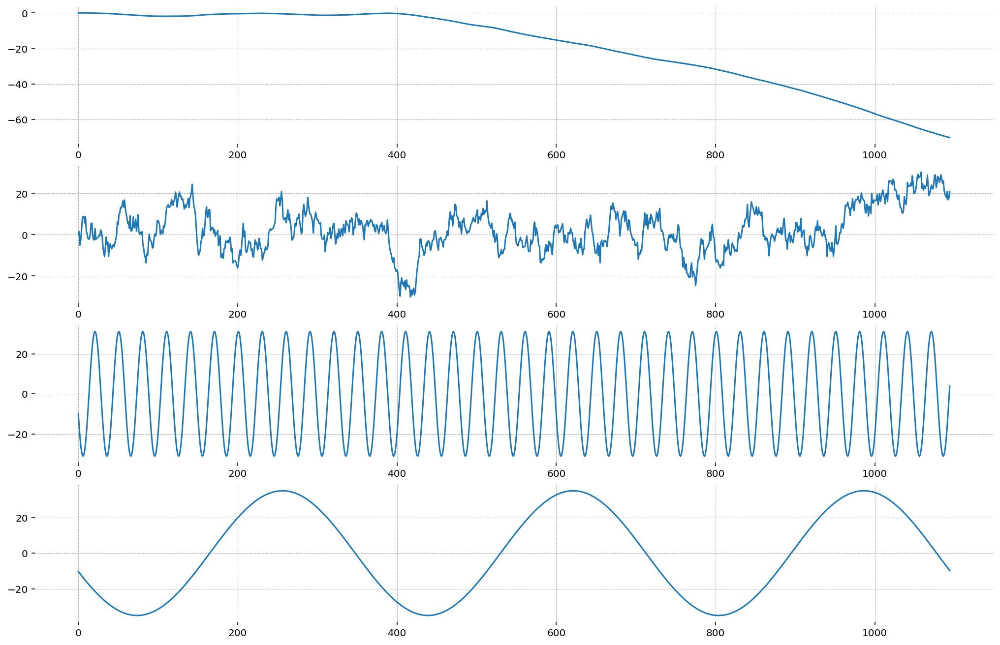

In [22]:
fig, ax = plt.subplots(4, figsize=(14, 9))
ax[0].plot(x[:, 0])
ax[1].plot(x[:, 2])
ax[2].plot(x[:, 3 : 3 + n_month * 2].sum(axis=-1))
ax[3].plot(x[:, -(n_year * 2) :].sum(axis=-1))
plt.show()

# PyMC Integration

Up until now I've been manually setting values in the statespace matrices, which is obviously not how this should be used. This has been for illustration purposes only.

What you should actually do is build a `PyMCStateSpace` model using the `.build()` method.

## Nile Data

Let's model the Nile river dataset with a smooth local level model with AR innovations and measurement error

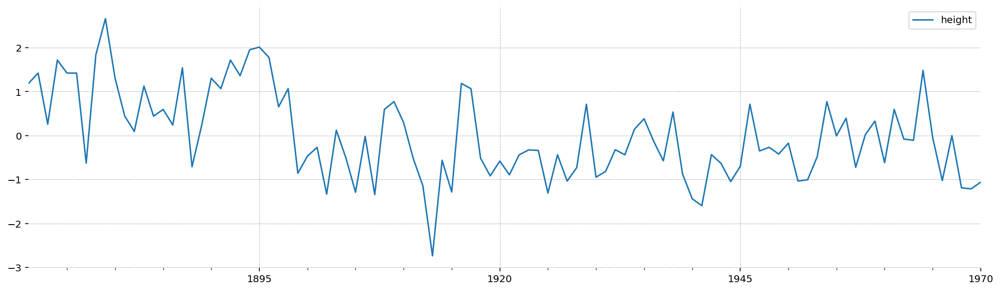

In [23]:
nile = pd.read_csv(
    "../pymc_experimental/tests/statespace/test_data/nile.csv", dtype={"x": "float64"}
)
nile.index = pd.date_range(start="1871-01-01", end="1970-01-01", freq="AS-Jan")
nile.rename(columns={"x": "height"}, inplace=True)
nile = (nile - nile.mean()) / nile.std()
nile.plot();

In [24]:
mod = st.LevelTrendComponent(order=2, innovations_order=[0, 1])
mod += st.AutoregressiveComponent(order=1)
mod += st.MeasurementError(name="obs")

ss_mod = mod.build(name="nile")

The following parameters should be assigned priors inside a PyMC model block: 
	initial_trend -- shape: (2,), constraints: None, dims: ('trend_states',)
	trend_sigmas -- shape: (1,), constraints: Positive, dims: ('trend_shocks',)
	ar_params -- shape: (1,), constraints: None, dims: (ar_lags, )
	sigma_ar -- shape: (1,), constraints: Positive, dims: None
	sigma_obs -- shape: (1,), constraints: Positive, dims: None
	P0 -- shape: (3, 3), constraints: Positive semi-definite, dims: ('state', 'state_aux')


In [25]:
ss_mod.param_dims

{'initial_trend': ('trend_states',),
 'trend_sigmas': ('trend_shocks',),
 'ar_params': ('ar_lags',),
 'sigma_obs': ('observed_state',),
 'P0': ('state', 'state_aux')}

In [26]:
trend_sigma_dims, initial_trend_dims, ar_dims, sigma_obs_dims, P0_dims = ss_mod.param_dims.values()
coords = ss_mod.coords

with pm.Model(coords=coords) as model_1:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=5, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", dims=initial_trend_dims)
    ar_params = pm.Beta("ar_params", alpha=1, beta=1, dims=ar_dims)

    trend_sigmas = pm.Gamma("trend_sigmas", alpha=2, beta=10, dims=trend_sigma_dims)
    sigma_obs = pm.Gamma("sigma_obs", alpha=2, beta=5, dims=["observed_state"])
    sigma_ar = pm.Gamma("sigma_ar", alpha=2, beta=10)

    ss_mod.build_statespace_graph(nile, mode="JAX")
    idata = pm.sample(nuts_sampler="numpyro")

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pymc/sampling/mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...
Compilation time =  0:00:06.747594
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time =  0:00:19.690393
Transforming variables...
Transformation time =  0:00:06.463478


/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/arviz/utils.py:185: NumbaDeprecationWarning: The keyword argument 'nopython=False' was supplied. From Numba 0.59.0 the default is being changed to True and use of 'nopython=False' will raise a warning as the argument will have no effect. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  numba_fn = numba.jit(**self.kwargs)(self.function)
/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


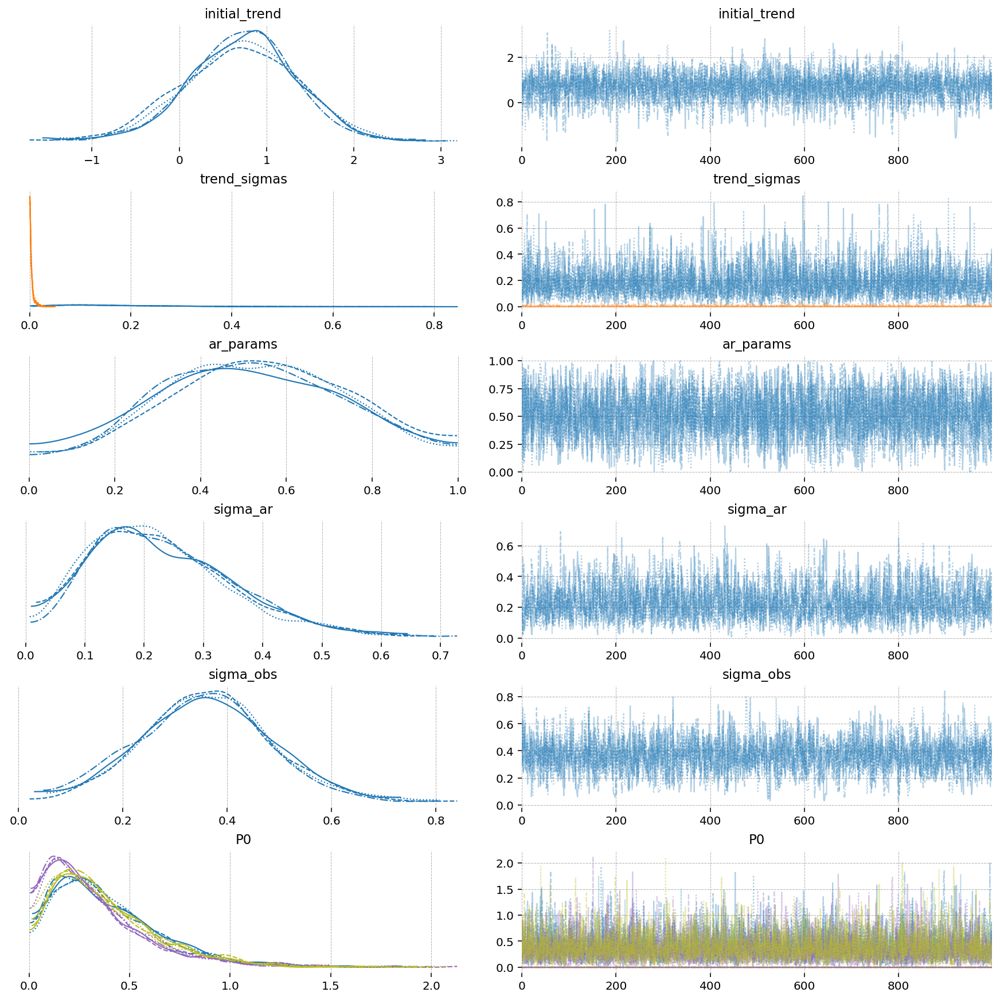

In [27]:
az.plot_trace(idata, var_names=ss_mod.param_names);

In [28]:
post_pred = ss_mod.sample_conditional_posterior(idata)

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pytensor/link/jax/linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3C5438CE40>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3C5438D1C0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3C5438D9A0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, predicted_posterior, smoothed_posterior]


We can look at smoother outputs since there is measurement noise. If there is no measurement noise, the smoother and filter will noiselessly encode the data, so only the outputs from the one-step ahead predictions are interesting.

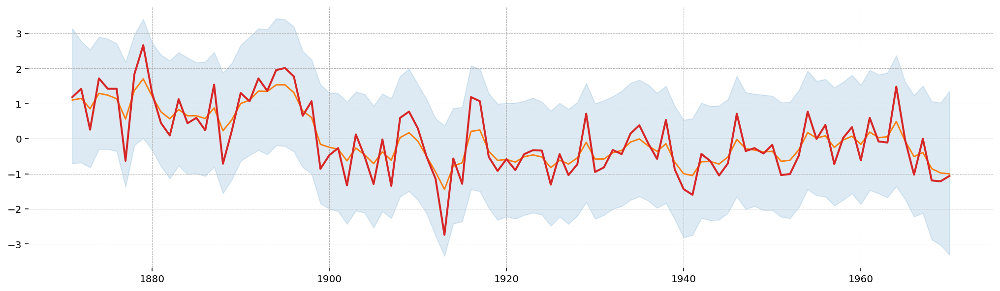

In [29]:
fig, ax = plt.subplots()
obs_idx = np.flatnonzero(mod.Z)
hdi = az.hdi(post_pred)
ax.plot(
    nile.index,
    post_pred.stack(sample=["chain", "draw"])
    .smoothed_posterior.isel(state=obs_idx)
    .sum(dim="state")
    .mean(dim="sample"),
    color="tab:orange",
)
ax.plot(nile.index, nile.values, color="tab:red", lw=2)
ax.fill_between(
    nile.index,
    *hdi.smoothed_posterior.isel(state=obs_idx).sum(dim="state").values.T,
    color="tab:blue",
    alpha=0.15
)

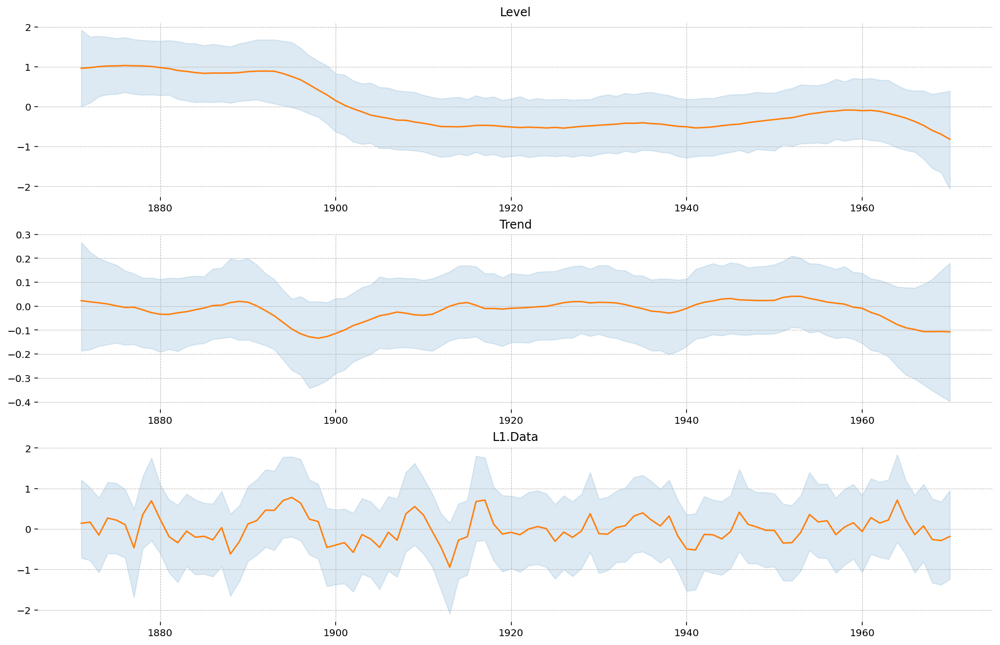

In [30]:
fig, ax = plt.subplots(3, 1, figsize=(14, 9))

for axis, state in zip(fig.axes, ss_mod.state_names):
    axis.plot(
        nile.index,
        post_pred.stack(sample=["chain", "draw"])
        .smoothed_posterior.sel(state=state)
        .mean(dim="sample"),
        color="tab:orange",
    )
    axis.fill_between(
        nile.index, *hdi.smoothed_posterior.sel(state=state).values.T, color="tab:blue", alpha=0.15
    )
    axis.set_title(state.title())

In [31]:
nile_forecast = ss_mod.forecast(idata, start=nile.index[-1], periods=10)
nile_forecast = nile_forecast.stack(sample=["chain", "draw"])

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pytensor/link/jax/linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3BC7CB9000>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


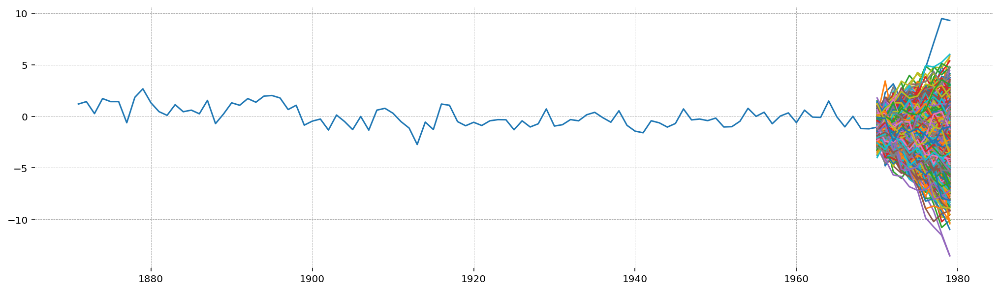

In [32]:
fig, ax = plt.subplots()
ax.plot(nile.index, nile.values)
ax.plot(nile_forecast.coords["time"], nile_forecast.forecast_observed.values.squeeze())
plt.show()

## Airline Data

Another famous timeseries dataset is the airline dataset. It has both a non-stationary trend and a seasonal component. We can model it with a local level and a seasonal trend. The seasonal trend will be time-varying, because it appears ot be increasing in strength

I leave away the measurement error just to emphasize that it's not necessary to have

<Axes: xlabel='index'>

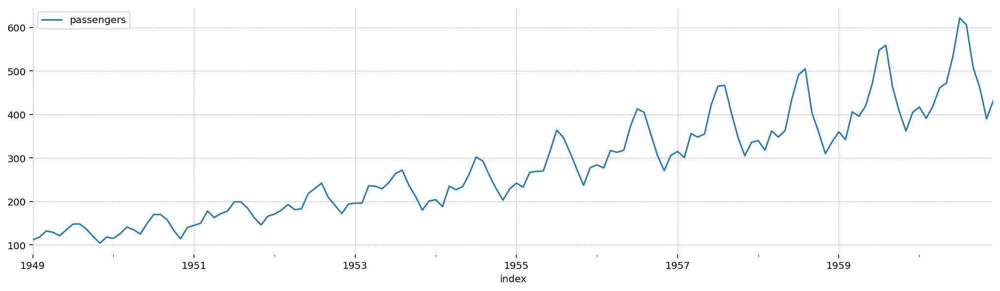

In [33]:
airpass = pd.read_csv(
    "../pymc_experimental/tests/statespace/test_data/airpass.csv",
    parse_dates=True,
    date_format="%Y %b",
    index_col=0,
    dtype={"value": float},
).rename(columns={"value": "passengers"})
airpass.index.freq = airpass.index.inferred_freq
airpass.plot()

In [55]:
ll = st.LevelTrendComponent(order=2)
se = st.FrequencySeasonality(season_length=12, name="annual")
mod = ll + se
ss_mod = mod.build()

The following parameters should be assigned priors inside a PyMC model block: 
	initial_trend -- shape: (2,), constraints: None, dims: ('trend_states',)
	trend_sigmas -- shape: (2,), constraints: Positive, dims: ('trend_shocks',)
	annual -- shape: (11,), constraints: None, dims: (annual_initial_state, )
	sigma_annual -- shape: (1,), constraints: Positive, dims: None
	P0 -- shape: (14, 14), constraints: Positive semi-definite, dims: ('state', 'state_aux')


In [56]:
ss_mod.param_dims

{'initial_trend': ('trend_states',),
 'trend_sigmas': ('trend_shocks',),
 'annual': ('annual_initial_state',),
 'P0': ('state', 'state_aux')}

In [57]:
trend_sigmas_dim, initial_trend_dim, annual_dims, P0_dim = ss_mod.param_dims.values()
coords = ss_mod.coords

In [58]:
with pm.Model(coords=coords) as model_2:
    P0_diag = pm.Gamma("P0_diag", alpha=2, beta=1, dims=P0_dims[0])
    P0 = pm.Deterministic("P0", pt.diag(P0_diag), dims=P0_dims)
    initial_trend = pm.Normal("initial_trend", sigma=[100, 1], dims=initial_trend_dims)
    annual_seasonal = pm.Normal("annual", sigma=100, dims=annual_dims)

    trend_sigmas = pm.Gamma("trend_sigmas", alpha=2, beta=1, dims=trend_sigma_dims)
    sigma_monthly_season = pm.Gamma("sigma_annual", alpha=2, beta=1)

    ss_mod.build_statespace_graph(airpass, mode="JAX")
    idata = pm.sample(nuts_sampler="numpyro")

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pymc/sampling/mcmc.py:273: UserWarning: Use of external NUTS sampler is still experimental
  warnings.warn("Use of external NUTS sampler is still experimental", UserWarning)


Compiling...
Compilation time =  0:00:05.403328
Sampling...


  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

  0%|          | 0/2000 [00:00<?, ?it/s]

Sampling time =  0:01:37.953564
Transforming variables...
Transformation time =  0:00:31.137581


/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/arviz/stats/density_utils.py:487: UserWarning: Your data appears to have a single value or no finite values
  warnings.warn("Your data appears to have a single value or no finite values")


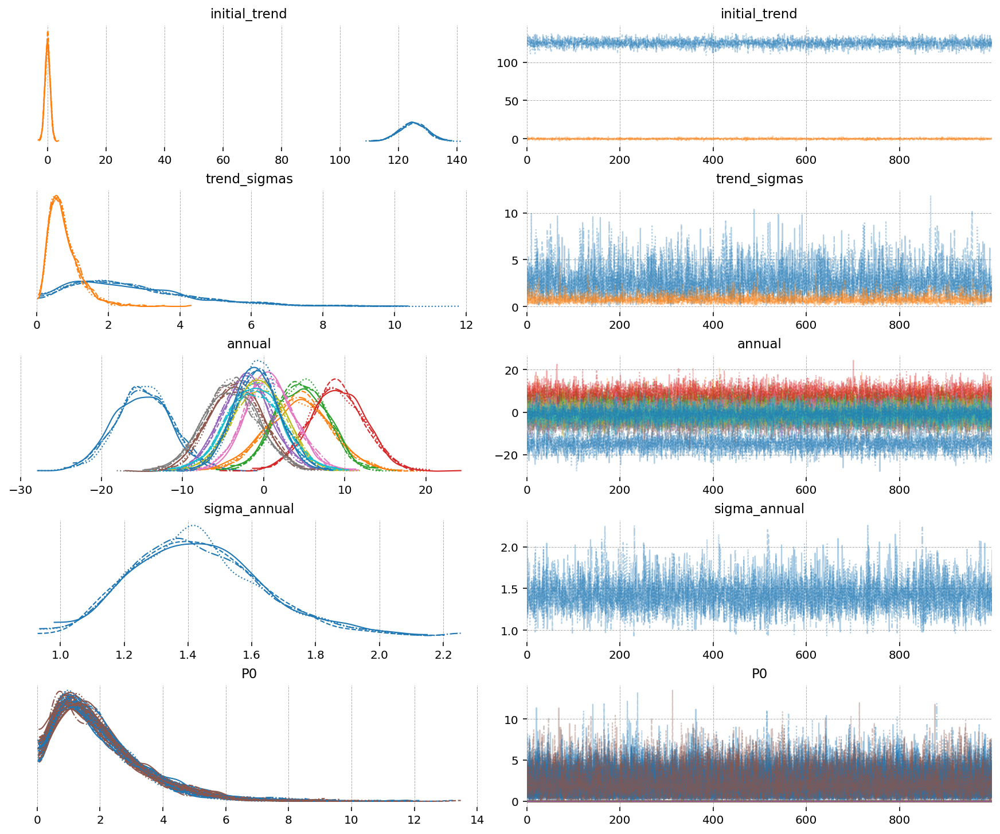

In [59]:
az.plot_trace(idata, var_names=ss_mod.param_names);

In [60]:
post = ss_mod.sample_conditional_posterior(idata)

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pytensor/link/jax/linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3B7E837A00>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3B7E837AE0>), RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3B7E837BC0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [filtered_posterior, predicted_posterior, smoothed_posterior]


In [61]:
hdi = az.hdi(post)
post_stacked = post.stack(sample=["chain", "draw"])

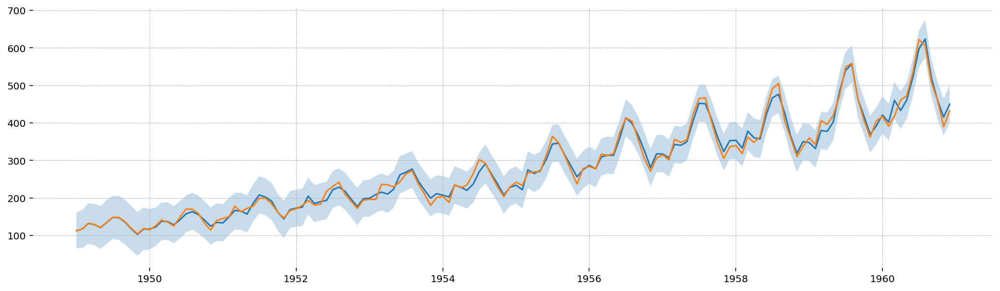

In [62]:
fig, ax = plt.subplots()
obs_idxs = np.flatnonzero(mod.Z)
x_values = post_stacked.coords["time"]
ax.plot(
    x_values,
    post_stacked.predicted_posterior.isel(state=obs_idxs).sum(dim="state").mean(dim="sample"),
)
ax.fill_between(
    x_values, *hdi.predicted_posterior.isel(state=obs_idxs).sum(dim="state").values.T, alpha=0.25
)
ax.plot(airpass.index, airpass.values)

To examine the individual components, the `StructuralTimeSeries` class has a helper method, `extract_components_from_idata`, to reconstruct them from the posterior predictive samples

In [63]:
component_idata = ss_mod.extract_components_from_idata(post)
component_states = component_idata.coords["state"].values.tolist()
component_states

['LevelTrend[level]', 'LevelTrend[trend]', 'annual']

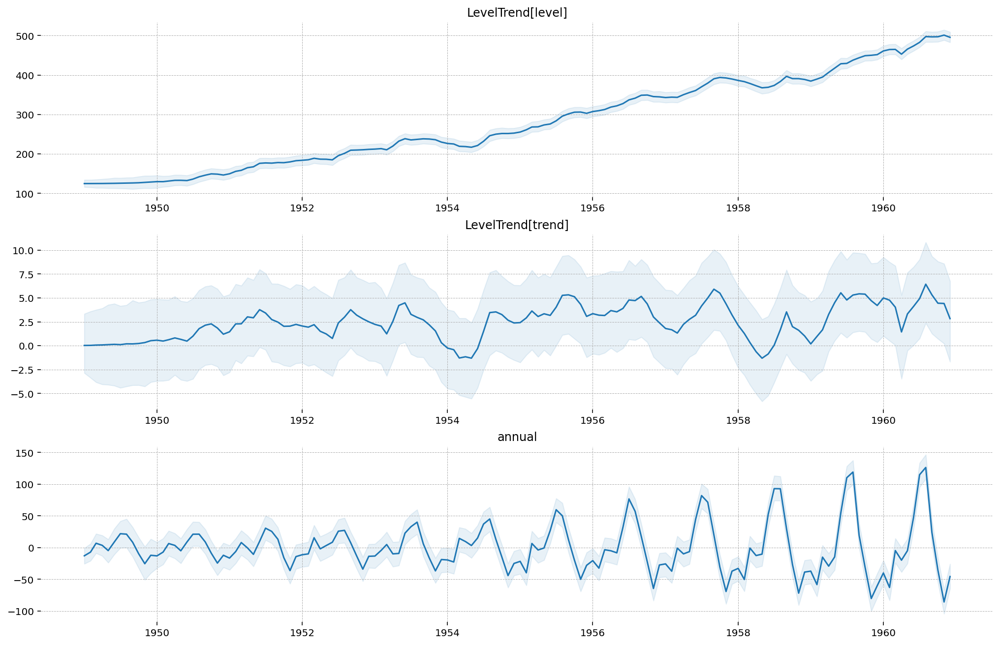

In [64]:
fig, ax = plt.subplots(3, 1, figsize=(14, 9))
x_values = component_idata.coords["time"]
for axis, name in zip(fig.axes, component_states):
    data = component_idata.predicted_posterior.sel(state=name)
    hdi = az.hdi(data).predicted_posterior
    mean = data.mean(dim=["chain", "draw"])

    axis.plot(x_values, mean)
    axis.fill_between(x_values, *hdi.values.T, color="tab:blue", alpha=0.1)
    axis.set_title(name)
plt.show()

In [65]:
forecasts = ss_mod.forecast(idata, start=airpass.index[-1], periods=12)
forecasts = forecasts.stack(sample=["chain", "draw"])

/home/jesse/mambaforge/envs/pymc-statespace/lib/python3.11/site-packages/pytensor/link/jax/linker.py:28: UserWarning: The RandomType SharedVariables [RandomGeneratorSharedVariable(<Generator(PCG64) at 0x7F3B7E5212A0>)] will not be used in the compiled JAX graph. Instead a copy will be used.
  warnings.warn(
Sampling: [forecast_combined]


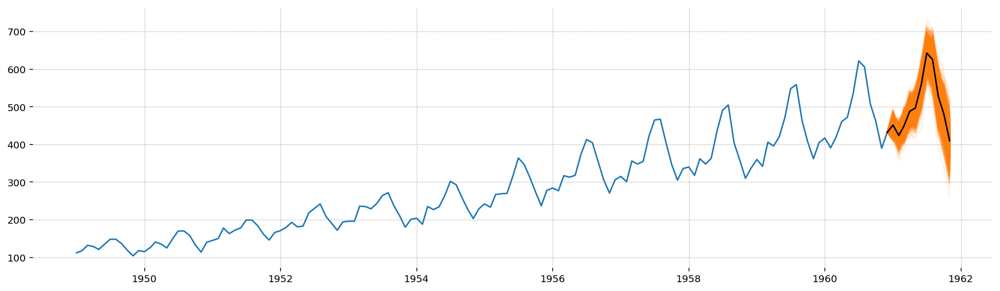

In [66]:
fig, ax = plt.subplots()
ax.plot(airpass.index, airpass)
ax.plot(
    forecasts.coords["time"],
    forecasts.forecast_observed.values.squeeze(),
    color="tab:orange",
    alpha=0.1,
)
ax.plot(
    forecasts.coords["time"],
    forecasts.forecast_observed.mean(dim="sample").values.squeeze(),
    color="k",
    alpha=1,
)

plt.show()